#1).....Extracting feature with VGG19 Network......

In [1]:
!unzip /content/tree.zip

Archive:  /content/tree.zip
  inflating: tree/2367idea99litchi_root_rot.jpg  
  inflating: tree/akasia (1).jfif    
  inflating: tree/akasia (1).jpg     
  inflating: tree/akasia (10).jfif   
  inflating: tree/akasia (2).jfif    
  inflating: tree/akasia (2).jpg     
  inflating: tree/akasia (3).jfif    
  inflating: tree/akasia (4).jfif    
  inflating: tree/akasia (5).jfif    
  inflating: tree/akasia (6).jfif    
  inflating: tree/akasia (7).jfif    
  inflating: tree/akasia (8).jfif    
  inflating: tree/akasia (9).jfif    
  inflating: tree/aonla (1).jfif     
  inflating: tree/aonla (2).jfif     
  inflating: tree/aonla (3).jfif     
  inflating: tree/aonla (4).jfif     
  inflating: tree/aonla (5).jfif     
  inflating: tree/aonla (6).jfif     
  inflating: tree/aonla (7).jfif     
  inflating: tree/aonla (8).jfif     
  inflating: tree/BetalNuts (1).jpg  
  inflating: tree/BetalNuts (10).jpg  
  inflating: tree/BetalNuts (11).jpg  
  inflating: tree/BetalNuts (12).jpg  
  infla

In [33]:
from os import listdir
from pickle import dump
from keras.applications.vgg19 import VGG19
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg19 import preprocess_input
from keras.models import Model

# extract features from each photo in the directory
def extract_features(directory):
	# load the model

	model = VGG19()

 
	# re-structure the model
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
	# summarize
	print(model.summary())
	# extract features from each photo
	features = dict()
	for name in listdir(directory):
		# load an image from file
		filename = directory + '/' + name
		image = load_img(filename, target_size=(224, 224))
		# convert the image pixels to a numpy array
		image = img_to_array(image)
		# reshape data for the model
		image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
		# prepare the image for the VGG model
		image = preprocess_input(image)
		# get features
		feature = model.predict(image, verbose=0)
		# get image id
		image_id = name.split('.')[0]
		# store feature
		features[image_id] = feature
		print('>%s' % name)
	return features

# extract features from all images
directory = 'tree'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('tree_features.pkl', 'wb'))

574726144/574710816 [==============================] - 5s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                          

# 2).....Import The Pkl File,Check features..........

In [34]:
import pickle
pickle_in = open("tree_features.pkl","rb")
features = pickle.load(pickle_in)

In [35]:
len(features)

714

In [36]:
features['BetalNuts (1)'][0,10:100]

array([1.42832825e-04, 1.31343235e-03, 1.02273631e-03, 6.55177864e-05,
       5.56662795e-04, 2.86455557e-04, 1.49813466e-04, 1.21781406e-04,
       3.22707550e-04, 5.52069359e-05, 1.84425880e-05, 5.65497437e-04,
       6.29457121e-04, 1.01965049e-03, 5.64950053e-04, 5.81360109e-05,
       7.42243938e-05, 1.96439250e-05, 1.89766597e-05, 2.53081871e-05,
       6.63803075e-05, 5.38131426e-05, 6.18296617e-05, 2.54619517e-04,
       9.11331517e-05, 2.94028978e-05, 2.11983701e-04, 2.06152436e-05,
       1.63136156e-05, 4.05047613e-04, 3.16145160e-05, 7.82770876e-05,
       7.09389060e-05, 9.31465620e-05, 5.21207876e-05, 1.99108545e-04,
       8.23841328e-05, 3.54807387e-04, 5.69291660e-06, 3.66359345e-05,
       7.55582005e-04, 1.76725971e-05, 1.04877863e-05, 4.64155382e-05,
       3.00077336e-05, 3.44927030e-05, 3.05106187e-05, 4.03864797e-05,
       2.41148111e-04, 3.27303540e-04, 4.20633951e-05, 3.53809378e-06,
       1.36727958e-05, 1.86966590e-05, 3.11196432e-04, 4.23207355e-04,
      

In [37]:
features

{'2367idea99litchi_root_rot': array([[3.48884714e-05, 8.06629487e-06, 2.83325107e-06, 1.04629889e-05,
         6.03173867e-05, 7.40216774e-06, 1.21965959e-05, 1.76823058e-03,
         4.40847874e-03, 1.04022492e-03, 3.80611891e-04, 9.68847540e-04,
         6.88516127e-04, 3.68087407e-04, 1.68330982e-04, 7.85052427e-04,
         9.81584599e-05, 1.86996098e-04, 5.67524461e-04, 1.01421312e-04,
         7.72526837e-05, 2.66317884e-03, 7.47754704e-03, 2.49132398e-03,
         5.98542159e-03, 5.28790231e-04, 9.32152325e-05, 1.61670730e-04,
         1.49017069e-04, 4.91300671e-05, 1.65028672e-04, 1.07147898e-04,
         8.71162702e-05, 2.64757418e-05, 2.65762737e-05, 2.39509449e-04,
         2.15937616e-04, 6.31952600e-04, 3.01471038e-04, 2.90778466e-03,
         9.96575225e-04, 1.16194866e-03, 1.43962598e-03, 6.91766217e-02,
         1.68438267e-03, 4.13015764e-03, 1.94147497e-03, 2.72891077e-04,
         3.60115767e-02, 2.24345457e-03, 7.72211642e-04, 3.33281874e-04,
         1.24388014e-0

In [38]:
label = {}

# 3)......... Class Create for Tree Classification.....

In [39]:
def get_class(ipt):
    class_id = 0
    if 'BetalNuts' in ipt : 
        class_id = 1
    elif 'GoldenApple' in ipt : 
        class_id = 2
    elif 'Guava' in ipt : 
        class_id = 3
    elif   'KalaKoroi' in ipt : 
        class_id = 4
    elif   'RajKoroi' in ipt : 
        class_id = 5
    elif 'akasia' in ipt : 
        class_id = 6
    elif  'aonla' in ipt : 
        class_id = 7
    elif  'bh' in ipt : 
        class_id = 8
    elif  'ca' in ipt : 
        class_id = 9
    elif  'cocunat' in ipt : 
        class_id = 10
    elif  'aonla' in ipt : 
        class_id = 11
    elif  'cowa' in ipt : 
        class_id = 12
    elif  'elepapple' in ipt : 
        class_id = 13
    elif  'indolive' in ipt : 
        class_id = 14
    elif  'jackfruit' in ipt : 
        class_id = 15
    elif  'karanja' in ipt : 
        class_id = 16
    elif  'lictree' in ipt : 
        class_id = 17
    elif  'mango' in ipt : 
        class_id = 18
    elif  'mehogoni' in ipt : 
        class_id = 19
    elif  'mojatree' in ipt : 
        class_id = 20
    elif  'neem' in ipt : 
        class_id = 21
    elif  'payara' in ipt : 
        class_id = 22
    elif  'plplam' in ipt : 
        class_id = 23
    elif  'pummelo' in ipt : 
        class_id = 24
    elif  'rantree' in ipt : 
        class_id = 25
    elif  'riverevony' in ipt : 
        class_id = 26
    elif  'sepota' in ipt : 
        class_id = 27
    elif  'shemul' in ipt : 
        class_id = 28
    elif  'sonalu' in ipt : 
        class_id = 29
    elif  'tamarind' in ipt : 
        class_id = 30
    elif  'velapple' in ipt : 
        class_id = 31
    elif  'wa' in ipt : 
        class_id = 32
    else :
     print("I don't know")

    return class_id

In [40]:
for key, value in features.items() :
    label[key] = get_class(key)

I don't know
I don't know
I don't know
I don't know


In [41]:
get_class('wa (4)')

32

In [42]:
label['mojatree (5)']

20

# 4).....Create Numpy Array, Train Test Splite......

In [43]:
x = []
y = []

In [44]:
for key, value in features.items() :
    x.append(features[key][0])
    y.append(label[key])

In [45]:
import numpy as np
x=np.array(x)
y=np.array(y)

In [46]:
x[1].shape

(1000,)

In [47]:
print (type(x))
print (type(y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [48]:
import numpy as np
x_train_data=np.array(x)
y_train_data=np.array(y)

In [49]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=800, shuffle=True)
#x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=800, shuffle=True)

#5)...Check Train Test Accuracy With svm

In [50]:
from sklearn import svm
#clf = svm.SVC(kernel='linear', C = 10.0, gamma=0.1)
#clf = svm.SVC()
#clf = svm.SVC(kernel='poly', degree=8)
#clf = svm.SVC(kernel='poly')
clf = svm.SVC(kernel='rbf')
#clf = svm.SVC(kernel='sigmoid')

#clf= svm.SVC(kernel='linear') 
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 31.944444444444443%


#6)Clasiification report (precision, recall,f1-score)

In [51]:
from sklearn.metrics import classification_report, confusion_matrix
#class_names = get_class
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.80      0.44      0.57         9
           2       0.50      0.17      0.25         6
           3       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         3
           9       0.67      1.00      0.80         2
          10       0.67      1.00      0.80         2
          13       0.20      0.50      0.29         2
          14       0.00      0.00      0.00         5
          15       0.67      1.00      0.80         2
          17       0.50      0.33      0.40         3
          18       0.00      0.00      0.00         0
          19       0.00      0.00      0.00         1
          20       1.00      0.14      0.25         7
          21       0.00      0.00      0.00         3
          22       0.00    

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

#7)Confusion matrix

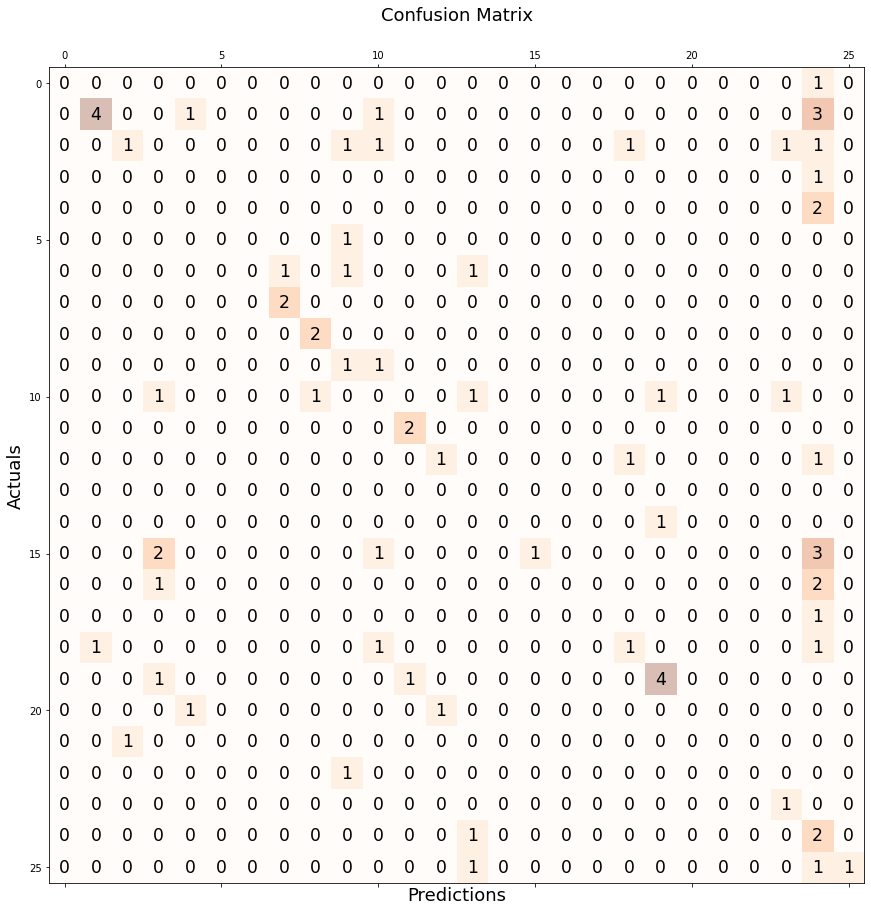

In [52]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import matplotlib.pyplot as plt
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(15, 15))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

#8)...Check Train Test Accuracy With Random Forest

In [53]:
from sklearn.ensemble import RandomForestClassifier

clf=RandomForestClassifier(n_estimators=40)

clf.fit(x_train,y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 34.72222222222222%


#5)...Check Train Test Accuracy With SVM,Roc Curve, PRC

In [54]:
#train accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

Accuracy: 31.61993769470405%


In [55]:
#test Accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)

#clf = svm.SVC(kernel='poly')

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 26.38888888888889%


In [56]:
!pip install scikit-plot

ValueError: ignored

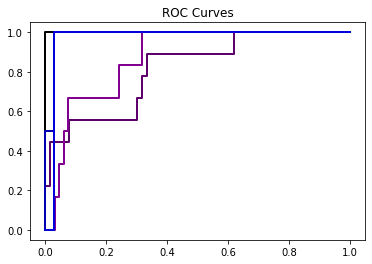

In [57]:
# roc Curve For Svm
import scikitplot as plt
from sklearn import svm
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
plt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

In [ ]:
#Precision-Recall Curve for svm
import scikitplot as skplt
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt

#6)...Check Train Test Accuracy With Logistic Regression,Roc Curve, PRC

In [ ]:
#train accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

In [ ]:
#test accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))


ValueError: ignored

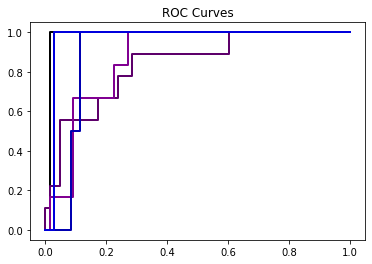

In [58]:
# roc Curve For Logistic Regresion
import scikitplot as skplt
from sklearn.linear_model import LogisticRegression
clfrf=LogisticRegression()
clfrf = clfrf.fit(x_train, y_train)
y_probas = clfrf.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

ValueError: ignored

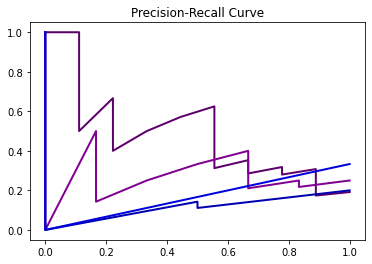

In [59]:
import scikitplot as skplt

from sklearn.linear_model import LogisticRegression
clfknnn = LogisticRegression()
clfknnn = clfknnn.fit(x_train, y_train)
y_probas = clfknnn.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, 
classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt


#7)......For Increase the accuracy K=5 fold cross Validation.....

In [60]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=4)

kf.get_n_splits(x)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232
 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250
 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268
 269 270 271 272 273 274 275 276 277 278 279 280 281 282 283 284 285 286
 287 288 289 290 291 292 293 294 295 296 297 298 299 300 301 302 303 304
 305 306 307 308 309 310 311 312 313 314 315 316 317 318 319 320 321 322
 323 324 325 326 327 328 329 330 331 332 333 334 335 336 337 338 339 340
 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356 357 358
 359 360 361 362 363 364 365 366 367 368 369 370 371 372 373 374 375 376
 377 378 379 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394
 395 396 397 398 399 400 401 402 403 404 405 406 407 408 409 410 411 412
 413 414 415 416 417 418 419 420 421 422 423

In [61]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
clf = svm.SVC(kernel='linear')
scores = cross_val_score(clf, x, y, cv=5)
scores
print("Accuracy: %0.2f (+/- %0.2f)" % ((scores.mean())*100, scores.std() * 2))

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  UserWarning,


Accuracy: 19.46 (+/- 0.05)
